In [148]:
import pandas as pd
import json
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import scipy
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score
import nltk
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords

In [149]:
# Read the JSON file into a Pandas dataframe
with open("C:/Users/visha/Downloads/Compressed/dutch_tweets_chunk0.json/dutch_tweets_chunk0.json") as input:
    data=json.load(input)
df=pd.DataFrame(data)

In [150]:
# Print the first few rows of the dataset
print(df.head())

# Check the shape of the dataset
print(df.shape)

# Check the data types of the columns
print(df.dtypes)

# Check for missing values
print(df.isnull().sum())

# Get some summary statistics for the numerical columns
print(df.describe())

# Check the value counts of the categorical columns
cat=[]
for col in df.select_dtypes(include=["object"]).columns:
    cat.append(df[col].value_counts())

                                           full_text  \
0  @pflegearzt @Friedelkorn @LAguja44 Pardon, wol...   
1  RT @grantshapps: Aviation demand is reduced du...   
2  RT @DDStandaard: De droom van D66 wordt werkel...   
3  RT @DDStandaard: De droom van D66 wordt werkel...   
4  De droom van D66 wordt werkelijkheid: COVID-19...   

                                    text_translation     created_at  \
0  @pflegearzt @Friedelkorn @ LAguja44 Pardon wol...  1583756789000   
1  RT @grantshapps: Aviation demand is reduced du...  1583756794000   
2  RT @DDStandaard: The D66 dream come true: COVI...  1583756797000   
3  RT @DDStandaard: The D66 dream come true: COVI...  1583756797000   
4  The D66 dream becomes reality: COVID-19 super ...  1583756807000   

   screen_name                                        description  \
0  TheoRettich  I ❤️science, therefore a Commie.   ☭ FALGSC: P...   
1  davidiwanow  I tweet a lot but love to engage & converse. P...   
2      EricL65               

In [151]:
df.columns

Index(['full_text', 'text_translation', 'created_at', 'screen_name',
       'description', 'desc_translation', 'weekofyear', 'weekday', 'day',
       'month', 'year', 'location', 'point_info', 'point', 'latitude',
       'longitude', 'altitude', 'province', 'hisco_standard', 'hisco_code',
       'industry', 'sentiment_pattern', 'subjective_pattern'],
      dtype='object')

In [152]:
#binning continous values to -1,0 & 1
threshold=0
df['sentiment_pattern'] = np.where(df['sentiment_pattern'] < threshold, -1, np.where(df['sentiment_pattern'] > threshold, 1, 0))
df['sentiment_pattern'].value_counts()

 0    11743
 1     9230
-1     6046
Name: sentiment_pattern, dtype: int64

In [153]:
# Create a Scattergeo map
data = [go.Scattergeo(
    lon = df['longitude'], # Column containing the longitude values
    lat = df['latitude'], # Column containing the latitude values
    text = df['text_translation'], # Column containing the tweet text
    mode = 'markers',
    marker = dict(
        size = 4,
        color = 'red',
        line_color = 'black',
        line_width = 1
    )
)]

# Plot the map
fig = go.Figure(data=data)
fig.show()

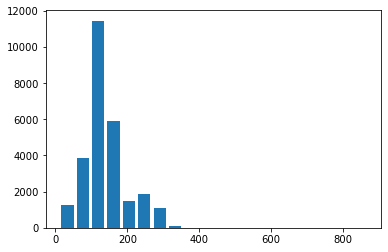

In [154]:
# Plot a histogram of the tweet lengths
df['tweet_length'] = df['text_translation'].apply(len)
plt.hist(df['tweet_length'], bins=20,rwidth=0.8)
plt.show()

<AxesSubplot:>

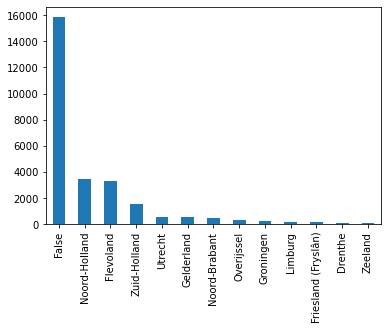

In [155]:
#Tweet count based on province
df['province'].value_counts().plot.bar()

- Most users dont have their location enabled.

<AxesSubplot:>

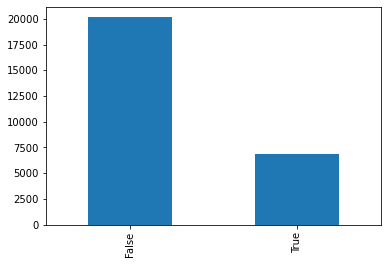

In [156]:
df['industry'].value_counts().plot.bar()

- Industry classification is possible for 30% of the tweets

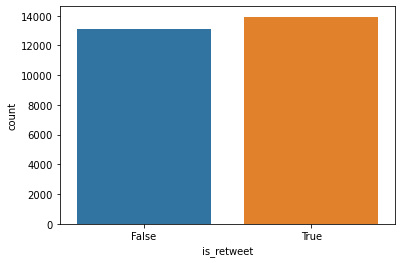

In [157]:
# Create a new column indicating whether the tweet is a retweet
df['is_retweet'] = df['text_translation'].str.startswith('RT @')
# Plot a bar plot of the number of tweets that are retweets
sns.countplot(x='is_retweet', data=df)
plt.show()

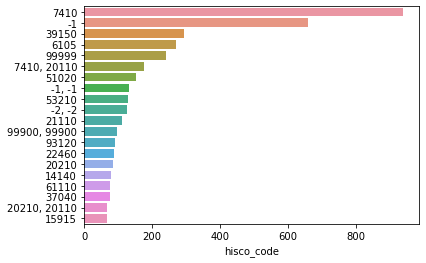

In [158]:
# Count the number of tweets with a HISCO code
df['hisco_code'].count()

# Print the unique values in the HISCO column
df['hisco_code'].unique()


# Plot a barplot of the most common HISCO codes
top_hisco = df['hisco_code'].value_counts()[:20]
sns.barplot(x=top_hisco, y=top_hisco.index)
plt.show()

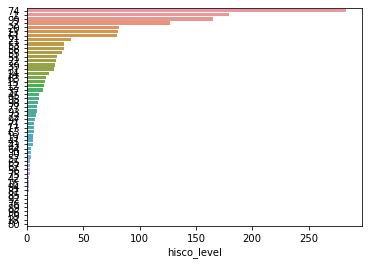

In [132]:
# Create a new column with the HISCO code level
df['hisco_level'] = df['hisco_code'].str[:2]

# Plot a barplot of the number of tweets by HISCO level
hisco_levels = df['hisco_level'].value_counts()
sns.barplot(x=hisco_levels, y=hisco_levels.index)
plt.show()

In [168]:
# Cleaning tweets
def clean_tweet(text):
    Text = ' '
    wordLemm = WordNetLemmatizer()
    temp = text.lower()
    temp = re.sub("rt @[A-Za-z0-9_]+","", temp)
    temp = re.sub("@[A-Za-z0-9_]+","", temp)
    temp = re.sub("#[A-Za-z0-9_]+","", temp)
    temp = re.sub(r'http\S+', '', temp)
    temp = re.sub('[:()!?]', ' ', temp)
    temp = re.sub('\[.*?\]',' ', temp)
    tweetwords=''
    for word in temp.split():
        if len(word)>1:
                    # Lemmatizing the word.
                    word = wordLemm.lemmatize(word)
                    tweetwords+= (word+' ')
            
    Text+=tweetwords
    return Text
# Extract hashtags
def extract_hashtags(text):
    hashtag_pattern = re.compile(r"#\S+")
    return hashtag_pattern.findall(text)

# Extract emojis
def extract_emojis(text):
    emoji_pattern = re.compile("["
        u"\U0001f600-\U0001f64f"  # emoticons
        u"\U0001f300-\U0001f5ff"  # symbols & pictographs
        u"\U0001f680-\U0001f6ff"  # transport & map symbols
        u"\U0001f1e0-\U0001f1ff"  # flags (iOS)
                           "]+", flags=re.UNICODE)
    return emoji_pattern.findall(text)

# Clean the tweet text
def clean_tweet(text):
    text = remove_urls(text)
    text = remove_usernames(text)
    text = remove_multiple_whitespaces(text)
    return text

In [ ]:
# extracting hashtags from non racist/sexist tweets

HT_positive = extract_hashtags(df['text_translation'][df['sentiment_pattern']==1])

# extracting hashtags from racist/sexist tweets
HT_negative = extract_hashtags(df['text_translation'][df['sentiment_pattern']==-1])

# unnesting list
HT_positive = sum(HT_positive,[])
HT_negative = sum(HT_negative,[])

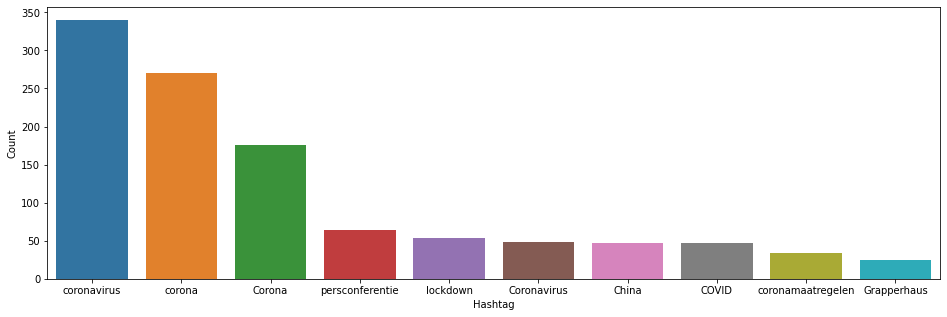

In [160]:
#Positive Hashtags
a = nltk.FreqDist(HT_positive)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count': list(a.values())})
# selecting top 10 most frequent hashtags     
d = d.nlargest(columns="Count", n = 10) 
plt.figure(figsize=(16,5))
ax = sns.barplot(data=d, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()

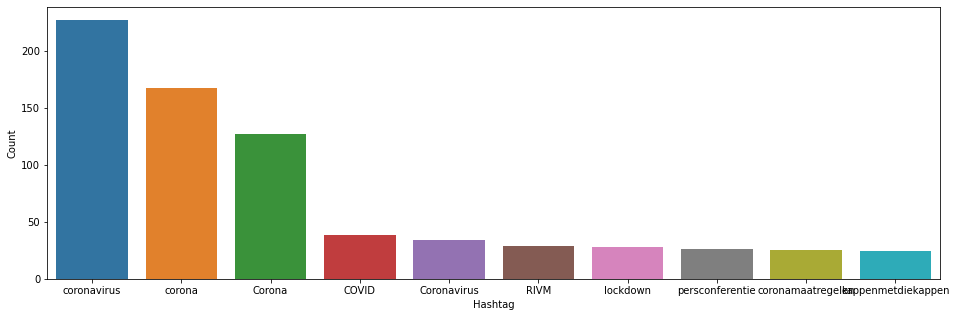

In [161]:
#Negative Hashtags
b = nltk.FreqDist(HT_negative)
e = pd.DataFrame({'Hashtag': list(b.keys()), 'Count': list(b.values())})
# selecting top 10 most frequent hashtags
e = e.nlargest(columns="Count", n = 10)   
plt.figure(figsize=(16,5))
ax = sns.barplot(data=e, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()

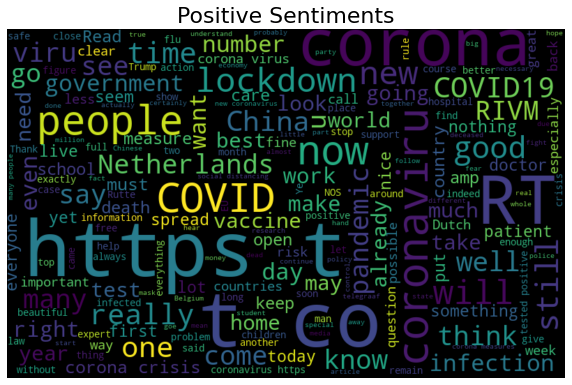

In [162]:
#Getting all positive sentiments
all_words = ' '.join([text for text in df['text_translation'][df['sentiment_pattern']==1]])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title("Positive Sentiments", fontsize = 22)
plt.show()

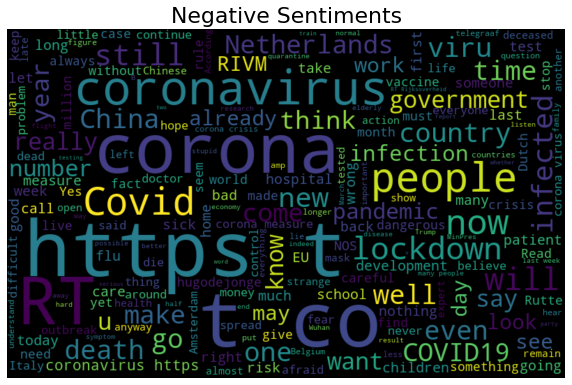

In [163]:
all_words = ' '.join([text for text in df['text_translation'][df['sentiment_pattern']==-1]])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title("Negative Sentiments", fontsize = 22)
plt.show()

In [169]:
# Extract features from the tweet text
vectorizer = TfidfVectorizer()
X_tweet = vectorizer.fit_transform(df["text_translation"].apply(clean_tweet))

In [170]:
# Extract features from the hashtags
vectorizer = TfidfVectorizer()
X_hashtags = vectorizer.fit_transform(df["text_translation"].apply(extract_hashtags).apply(" ".join))

In [ ]:
# Extract features from the emojis
vectorizer = CountVectorizer()
X_emojis = vectorizer.fit_transform(df["text_translation"].apply(extract_emojis).apply(" ".join))

In [171]:
# Combine the extracted features
X = scipy.sparse.hstack([X_tweet, X_hashtags],)

# Assign the emoji score as the target variable
y = df["sentiment_pattern"]

# Split the data into a training set and a test set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data

scaler = StandardScaler(with_mean=False)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [172]:
# Build the model
model = LogisticRegression(max_iter=1000)
model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred,average='macro')
recall = recall_score(y_test, y_pred,average='macro')

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

Accuracy: 0.77
Precision: 0.77
Recall: 0.77
